In [1]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns
import os, time, random
%matplotlib inline
plt.style.use("ggplot")
colors = sns.color_palette("Set3")
pd.set_option('display.max_colwidth', -1)    

import warnings
warnings.filterwarnings("ignore")

train = pd.read_csv("../input/train/train.csv").fillna("")

In [2]:
train.head()

,Type,Name,Age,Breed1,Breed2,Gender,Color1,Color2,Color3,MaturitySize,FurLength,Vaccinated,Dewormed,Sterilized,Health,Quantity,Fee,State,RescuerID,VideoAmt,Description,PetID,PhotoAmt,AdoptionSpeed
0,2,Nibble,3,299,0,1,1,7,0,1,1,2,2,2,1,1,100,41326,8480853f516546f6cf33aa88cd76c379,0,Nibble is a 3+ month old ball of cuteness. He is energetic and playful. I rescued a couple of cats a few months ago but could not get them neutered in time as the clinic was fully scheduled. The result was this little kitty. I do not have enough space and funds to care for more cats in my household. Looking for responsible people to take over Nibble's care.,86e1089a3,1.0,2
1,2,No Name Yet,1,265,0,1,1,2,0,2,2,3,3,3,1,1,0,41401,3082c7125d8fb66f7dd4bff4192c8b14,0,I just found it alone yesterday near my apartment. It was shaking so I had to bring it home to provide temporary care.,6296e909a,2.0,0
2,1,Brisco,1,307,0,1,2,7,0,2,2,1,1,2,1,1,0,41326,fa90fa5b1ee11c86938398b60abc32cb,0,"Their pregnant mother was dumped by her irresponsible owner at the roadside near some shops in Subang Jaya. Gave birth to them at the roadside. They are all healthy and adorable puppies. Already dewormed, vaccinated and ready to go to a home. No tying or caging for long hours as guard dogs. However, it is acceptable to cage or tie for precautionary purposes. Interested to adopt pls call me.",3422e4906,7.0,3
3,1,Miko,4,307,0,2,1,2,0,2,1,1,1,2,1,1,150,41401,9238e4f44c71a75282e62f7136c6b240,0,"Good guard dog, very alert, active, obedience waiting for her good master, plz call or sms for more details if you really get interested, thanks!!",5842f1ff5,8.0,2
4,1,Hunter,1,307,0,1,1,0,0,2,1,2,2,2,1,1,0,41326,95481e953f8aed9ec3d16fc4509537e8,0,"This handsome yet cute boy is up for adoption. He is the most playful pal we've seen in our puppies. He loves to nibble on shoelaces , Chase you at such a young age. Imagine what a cute brat he will be when he grows. We are looking for a loving home for Hunter , one that will take care of him and give him the love that he needs. Please call urgently if you would like to adopt this cutie.",850a43f90,3.0,2


In [3]:
train.isna().sum()

Type             0
Name             0
Age              0
Breed1           0
Breed2           0
Gender           0
Color1           0
Color2           0
Color3           0
MaturitySize     0
FurLength        0
Vaccinated       0
Dewormed         0
Sterilized       0
Health           0
Quantity         0
Fee              0
State            0
RescuerID        0
VideoAmt         0
Description      0
PetID            0
PhotoAmt         0
AdoptionSpeed    0
dtype: int64

In [4]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
Type,14993.0,1.457614,0.498217,1.0,1.0,1.0,2.0,2.0
Age,14993.0,10.452078,18.155790,0.0,2.0,3.0,12.0,255.0
Breed1,14993.0,265.272594,60.056818,0.0,265.0,266.0,307.0,307.0
Breed2,14993.0,74.009738,123.011575,0.0,0.0,0.0,179.0,307.0
Gender,14993.0,1.776162,0.681592,1.0,1.0,2.0,2.0,3.0
Color1,14993.0,2.234176,1.745225,1.0,1.0,2.0,3.0,7.0
Color2,14993.0,3.222837,2.742562,0.0,0.0,2.0,6.0,7.0
Color3,14993.0,1.882012,2.984086,0.0,0.0,0.0,5.0,7.0
MaturitySize,14993.0,1.862002,0.547959,1.0,2.0,2.0,2.0,4.0
FurLength,14993.0,1.467485,0.599070,1.0,1.0,1.0,2.0,3.0


In [5]:
train["Type"] = train["Type"].apply(lambda x: "Dog" if x == 1 else "Cat")

In [6]:
def isEnglish(s):
    s = str(s)
    return len(s) == len(s.encode())

# train["is_english"] = train["Description"].apply(lambda x: isEnglish(x))

## Target

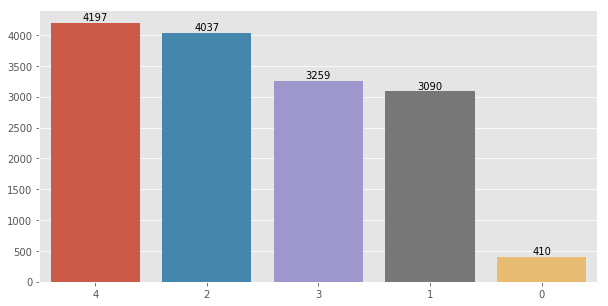

In [7]:
target_count = train["AdoptionSpeed"].value_counts()
order = target_count.index
plt.figure(figsize = (10, 5))
ax = sns.barplot(target_count.index, target_count.values, order = order)
rects = ax.patches
labels = target_count.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5,
            label, ha = "center", va = "bottom")
plt.show()

### Name

In [8]:
NameCount = train[["AdoptionSpeed", "Name"]].groupby(by = "Name").count().sort_values(by = "AdoptionSpeed", ascending = False)
NameCount.columns = ["NameCount"]
NameCount

,NameCount
Name,
,1257
Baby,66
Lucky,64
No Name,54
Brownie,54
Mimi,52
Blackie,49
Puppy,45
Kitty,39


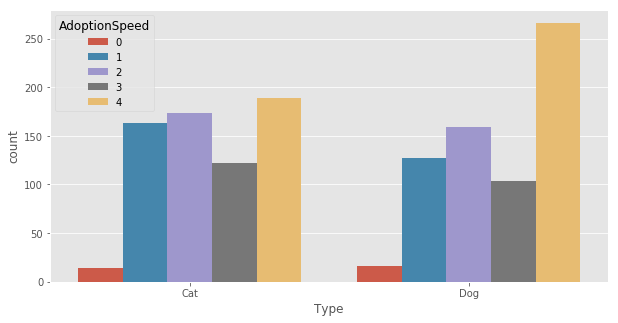

In [9]:
no_name = train[(train["Name"] == "") | (train["Name"] == "No Name") | (train["Name"] == "No Name Yet")][["Type", "Name", "AdoptionSpeed"]]
plt.figure(figsize = (10, 5))
sns.countplot("Type", hue = "AdoptionSpeed", data = no_name)
plt.show()

## Type

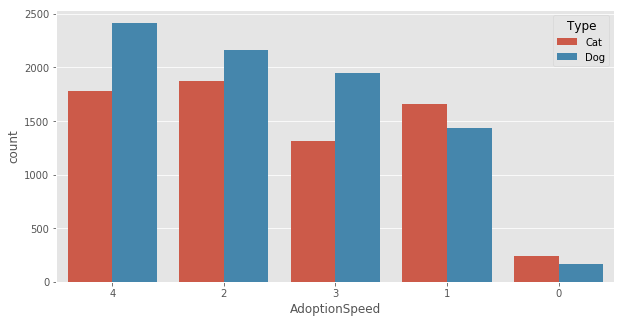

In [10]:
plt.figure(figsize = (10, 5))
sns.countplot("AdoptionSpeed", hue = "Type", data = train, order = order)
plt.show()

### Age v.s. Target

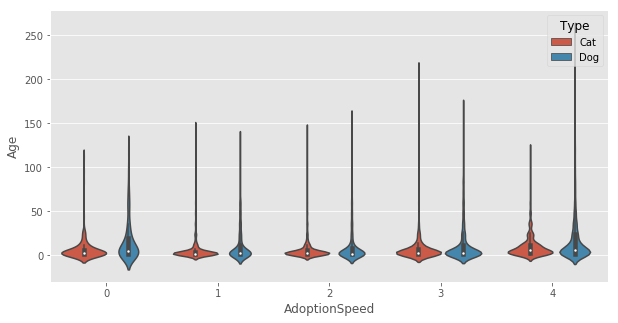

In [11]:
plt.figure(figsize = (10, 5))
sns.violinplot(x = "AdoptionSpeed", y = "Age", hue = "Type", data = train)
plt.show()

### Health, Vaccinated, Dewormed, Sterilized v.s. Adoption Speed

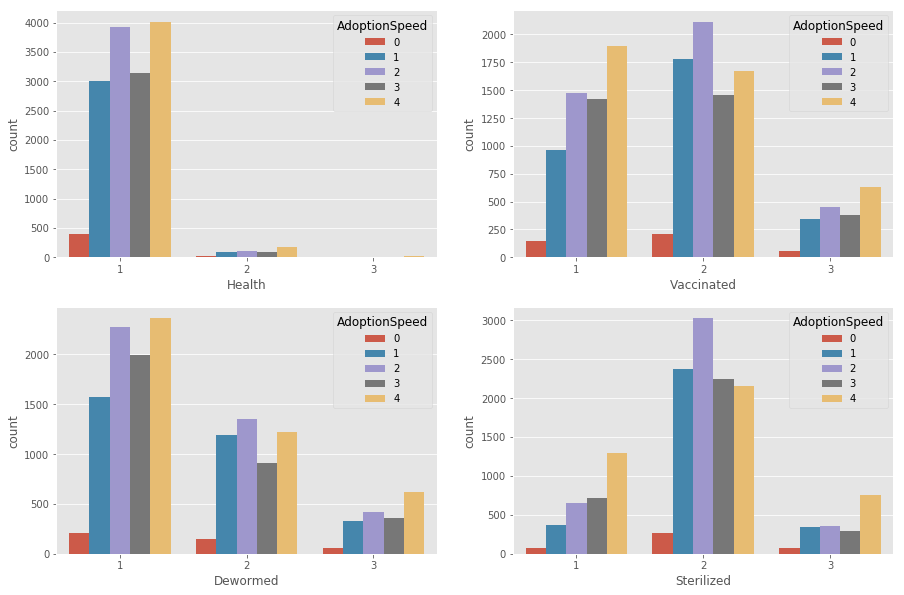

In [12]:
fig, ax = plt.subplots(2, 2, figsize = (15, 10))
cat = ["Health", "Vaccinated", "Dewormed", "Sterilized"]
for i, c in enumerate(cat):
    sns.countplot(c, hue = "AdoptionSpeed", data = train, ax = ax[i//2][i%2])
plt.show()

## Description

In [13]:
import bokeh.plotting as bp
from bokeh.models import HoverTool, BoxSelectTool
from bokeh.models import ColumnDataSource
from bokeh.plotting import figure, show, output_notebook, reset_output
from bokeh.palettes import d3
import bokeh.models as bmo
from bokeh.io import save, output_file

from sklearn.manifold import TSNE
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

output_notebook()

cv = CountVectorizer(min_df = 10,
                     max_features = 100000,
                     analyzer = "word",
                     ngram_range = (1, 2),
                     stop_words = "english",
                     token_pattern = '[a-zA-Z]')

cout_vectors = cv.fit_transform(train["Description"])

Loading BokehJS ...

In [14]:
from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD(n_components = 30, random_state = 32)
svd_coutvectors = svd.fit_transform(cout_vectors)

svd_coutvectors.shape

(14993, 30)

In [15]:
tsne_model = TSNE(n_components = 2, verbose = 1, random_state = 32, n_iter = 500)
tsne_countvectors = tsne_model.fit_transform(svd_coutvectors)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 14993 samples in 0.023s...
[t-SNE] Computed neighbors for 14993 samples in 5.711s...
[t-SNE] Computed conditional probabilities for sample 1000 / 14993
[t-SNE] Computed conditional probabilities for sample 2000 / 14993
[t-SNE] Computed conditional probabilities for sample 3000 / 14993
[t-SNE] Computed conditional probabilities for sample 4000 / 14993
[t-SNE] Computed conditional probabilities for sample 5000 / 14993
[t-SNE] Computed conditional probabilities for sample 6000 / 14993
[t-SNE] Computed conditional probabilities for sample 7000 / 14993
[t-SNE] Computed conditional probabilities for sample 8000 / 14993
[t-SNE] Computed conditional probabilities for sample 9000 / 14993
[t-SNE] Computed conditional probabilities for sample 10000 / 14993
[t-SNE] Computed conditional probabilities for sample 11000 / 14993
[t-SNE] Computed conditional probabilities for sample 12000 / 14993
[t-SNE] Computed conditional probabilities for sam

In [16]:
tsne_countvectors_df = pd.DataFrame(tsne_countvectors)
tsne_countvectors_df.columns = ["x", "y"]
tsne_countvectors_df["Type"] = train["Type"].values
tsne_countvectors_df["AdoptionSpeed"] = train["AdoptionSpeed"].values
tsne_countvectors_df["Description"] = train["Description"].values

In [17]:
colormap = np.array(["#6d8dca", "#69de53", "#723bca", "#c3e14c", "#c84dc9"])

In [18]:
plot_tsne = bp.figure(plot_width = 700, plot_height = 600,
                      title = "COUNT SVD clustering on Pets' Descriptions",
                      tools = "pan, wheel_zoom, box_zoom, reset, hover, previewsave",
                      x_axis_type = None, y_axis_type = None, min_border = 1)
source = ColumnDataSource(data = dict(x = tsne_countvectors_df["x"],
                                      y = tsne_countvectors_df["y"],
                                      color = colormap[list(tsne_countvectors_df["AdoptionSpeed"])],
                                      Type = tsne_countvectors_df["Type"],
                                      AdoptionSpeed = tsne_countvectors_df["AdoptionSpeed"],
                                      Description = tsne_countvectors_df["Description"]))

plot_tsne.scatter(x = "x", y = "y", color = "color", source = source)
hover = plot_tsne.select(dict(type = HoverTool))
hover.tooltips = {"Type": "@Type", "AdoptionSpeed": "@AdoptionSpeed", "Description": "@Description"}
show(plot_tsne)

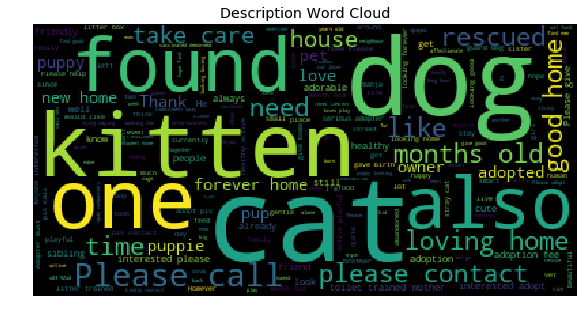

In [19]:
from wordcloud import WordCloud
import re
import string
from nltk.corpus import stopwords

stop_words = set(stopwords.words("english"))
punts = string.punctuation

wc = WordCloud(max_words = 1000, stopwords = stop_words)
wc.generate(" ".join(train["Description"]))

plt.figure(figsize = (10, 5))
plt.imshow(wc)
plt.title("Description Word Cloud")
plt.axis("off")
plt.show()

In [20]:
tfidf_vec = TfidfVectorizer(min_df = 30, max_features = None,
                            strip_accents = "unicode", analyzer = "word",
                            token_pattern = r"\w{1,}", ngram_range = (1, 3),
                            use_idf = 1, smooth_idf = 1, sublinear_tf = 1,
                            stop_words = "english")

tdidf_vectors = tfidf_vec.fit_transform(train["Description"])
tdidf_vectors.shape

(14993, 3112)

In [21]:
svd = TruncatedSVD(n_components = 50, random_state = 32)
svd_tfidfvectors = svd.fit_transform(tdidf_vectors)

svd_tfidfvectors.shape

(14993, 50)

In [22]:
tsne_model = TSNE(n_components = 2, verbose = 1, random_state = 32, n_iter = 500)
tsne_tfidfvectors = tsne_model.fit_transform(svd_tfidfvectors)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 14993 samples in 0.044s...
[t-SNE] Computed neighbors for 14993 samples in 30.918s...
[t-SNE] Computed conditional probabilities for sample 1000 / 14993
[t-SNE] Computed conditional probabilities for sample 2000 / 14993
[t-SNE] Computed conditional probabilities for sample 3000 / 14993
[t-SNE] Computed conditional probabilities for sample 4000 / 14993
[t-SNE] Computed conditional probabilities for sample 5000 / 14993
[t-SNE] Computed conditional probabilities for sample 6000 / 14993
[t-SNE] Computed conditional probabilities for sample 7000 / 14993
[t-SNE] Computed conditional probabilities for sample 8000 / 14993
[t-SNE] Computed conditional probabilities for sample 9000 / 14993
[t-SNE] Computed conditional probabilities for sample 10000 / 14993
[t-SNE] Computed conditional probabilities for sample 11000 / 14993
[t-SNE] Computed conditional probabilities for sample 12000 / 14993
[t-SNE] Computed conditional probabilities for sa

In [23]:
tsne_tfidfvectors_df = pd.DataFrame(tsne_tfidfvectors)
tsne_tfidfvectors_df.columns = ["x", "y"]
tsne_tfidfvectors_df["Type"] = train["Type"].values
tsne_tfidfvectors_df["AdoptionSpeed"] = train["AdoptionSpeed"].values
tsne_tfidfvectors_df["Description"] = train["Description"].values

In [24]:
plot_tsne = bp.figure(plot_width = 700, plot_height = 600,
                      title = "TFIDF SVD clustering on Pets' Descriptions",
                      tools = "pan, wheel_zoom, box_zoom, reset, hover, previewsave",
                      x_axis_type = None, y_axis_type = None, min_border = 1)
source = ColumnDataSource(data = dict(x = tsne_tfidfvectors_df["x"],
                                      y = tsne_tfidfvectors_df["y"],
                                      color = colormap[list(tsne_tfidfvectors_df["AdoptionSpeed"])],
                                      Type = tsne_tfidfvectors_df["Type"],
                                      AdoptionSpeed = tsne_tfidfvectors_df["AdoptionSpeed"],
                                      Description = tsne_tfidfvectors_df["Description"]))

plot_tsne.scatter(x = "x", y = "y", color = "color", source = source)
hover = plot_tsne.select(dict(type = HoverTool))
hover.tooltips = {"Type": "@Type", "AdoptionSpeed": "@AdoptionSpeed", "Description": "@Description"}
show(plot_tsne)

### State v.s. Adoption Speed

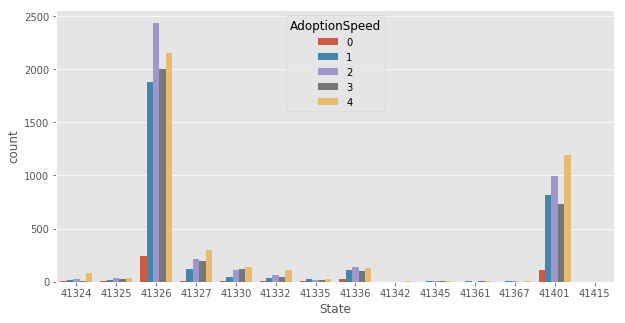

In [25]:
plt.figure(figsize = (10, 5))
sns.countplot("State", hue = "AdoptionSpeed", data = train)
plt.show()

### State v.s. Type

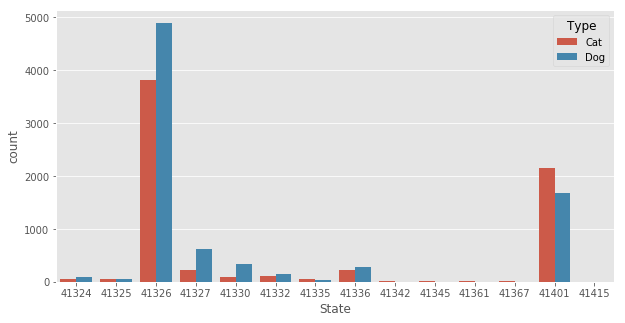

In [26]:
plt.figure(figsize = (10, 5))
sns.countplot("State", hue = "Type", data = train)
plt.show()

## Fee

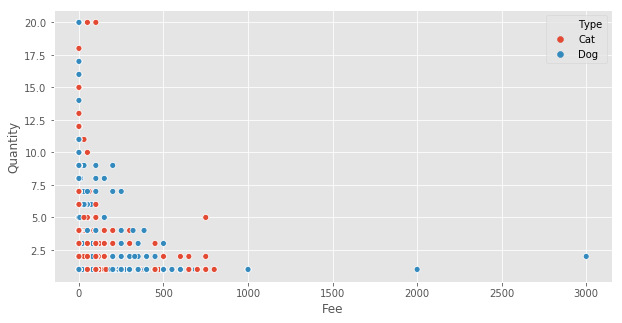

In [27]:
plt.figure(figsize = (10, 5))
sns.scatterplot("Fee", "Quantity", hue = "Type", data = train)
plt.show()

In [28]:
extreme_fee = train[train["Fee"] >= 1000]
extreme_fee[["Type", "Age", "Description", "Fee", "AdoptionSpeed"]]

,Type,Age,Description,Fee,AdoptionSpeed
2078,Dog,8,Open for Adoption with Fees Looking for new lovely home due to owner lack of time & care... Vaccination & Deworm up to date Contact me for more details,1000,2
4844,Dog,7,"She is pure breed Siberian husky. Born at July . She has beautiful blue eye. Character is very gentle. Never bark or be aggressive. Her owner had to move from previous house and new place not allows dog. So we foster her for few month. I love her so much. But she requires more exercise than I can give. (Currently I walk her 1hour/day) and our house has no garden but only balcony. I feel that we better find suitable home ( experienced dog lover with enough time and space) and current owner also agreed on this. Anybody interested, please contact.",1000,2
8722,Dog,4,"Both pups are family home trained. They love their walks on lead and off lead. Both male and female are from different lineage and both have MKA Reg Certs. They are 4mths and at perfect age for training. The 2pups know some commands like ""sit"" ""outside"" ""leave"" ""crate"" and more. They are family friendly and can stay/sleep indoors and out. They've just learnt to swim and belly rubs. Great dogs for families that wants a pet and a watchdog too. All vaccines complete, dewormed, microchipped and spayed.",3000,3
8834,Dog,24,adpoted,1000,0
8879,Dog,8,Looking for new lovely home due to owner lack of time & care... Vaccination & Deworm up to date Contact me for more details,1000,1
10477,Dog,24,"Found this bull dog near my neighbourhood for a month now. I have 3 dogs myself at home. Cannot take care of it. Hopefully if there is someone who is loving who can take care of it. It is very cute and friendly but the saliva keep on drooling. overall there is nothing. forgot to mention, please keep him indoor. He likes to sleep on mattress or sofa, if can please prepare a mattress for him. PLEASE SMS , DONT CALL",2000,1


In [29]:
adoption_fee = train[["Type", "Age", "State", "Fee", "AdoptionSpeed"]]

In [30]:
type_fee = adoption_fee[["Type", "Fee"]].groupby(by = "Type").mean().sort_values(by = "Fee",ascending = False)
type_fee.columns = ["AverageAdoptionFee"]
type_fee

,AverageAdoptionFee
Type,
Dog,24.294638
Cat,17.663169


In [31]:
state_fee = adoption_fee[["State", "Fee"]].groupby(by = "State").mean().sort_values(by = "Fee",ascending = False)
state_fee.columns = ["AverageAdoptionFee"]
state_fee

,AverageAdoptionFee
State,
41342,63.846154
41335,31.294118
41325,29.563636
41336,28.641026
41361,26.923077
41326,22.638283
41401,19.101691
41367,16.666667
41324,16.576642


In [32]:
adoption_fee["Fee"] = np.log(adoption_fee["Fee"] + 1)

### Fee v.s. Age

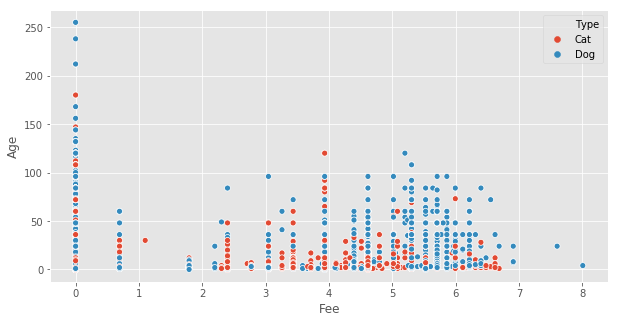

In [33]:
plt.figure(figsize = (10, 5))
sns.scatterplot("Fee", "Age", hue = "Type", data = adoption_fee)
plt.show()

### Fee v.s. Type

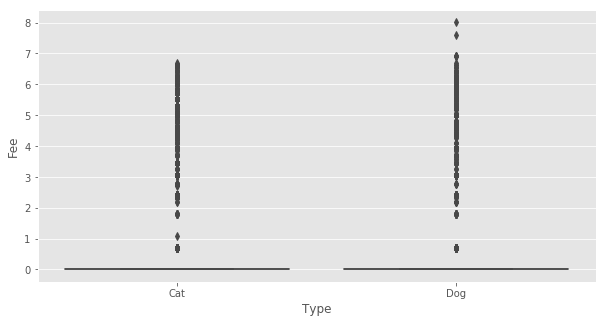

In [34]:
plt.figure(figsize = (10, 5))
sns.boxplot(adoption_fee["Type"], adoption_fee["Fee"])
plt.show()

### Fee v.s. State

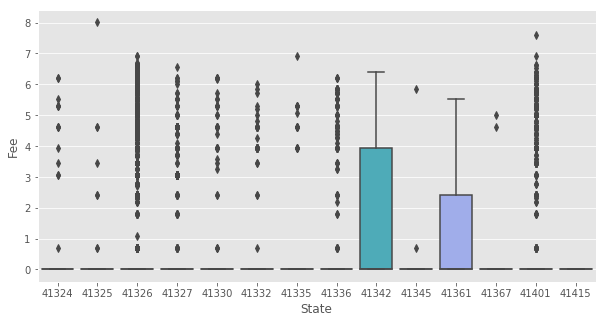

In [35]:
plt.figure(figsize = (10, 5))
sns.boxplot(adoption_fee["State"], adoption_fee["Fee"])
plt.show()

### Fee v.s. Adoption Speed

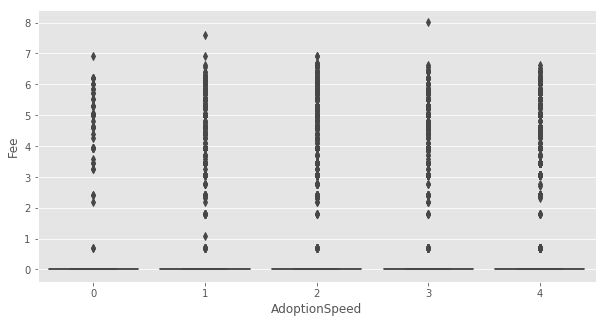

In [36]:
plt.figure(figsize = (10, 5))
sns.boxplot(adoption_fee["AdoptionSpeed"], adoption_fee["Fee"])
plt.show()

### Un-Free Adoption

In [37]:
un_free_adoption = train[train["Fee"] > 0][["Type", "Age", "State", "Fee", "AdoptionSpeed"]]
un_free_adoption.head()

,Type,Age,State,Fee,AdoptionSpeed
0,Cat,3,41326,100,2
3,Dog,4,41401,150,2
6,Cat,12,41326,300,1
11,Cat,3,41326,50,1
17,Dog,8,41330,10,4


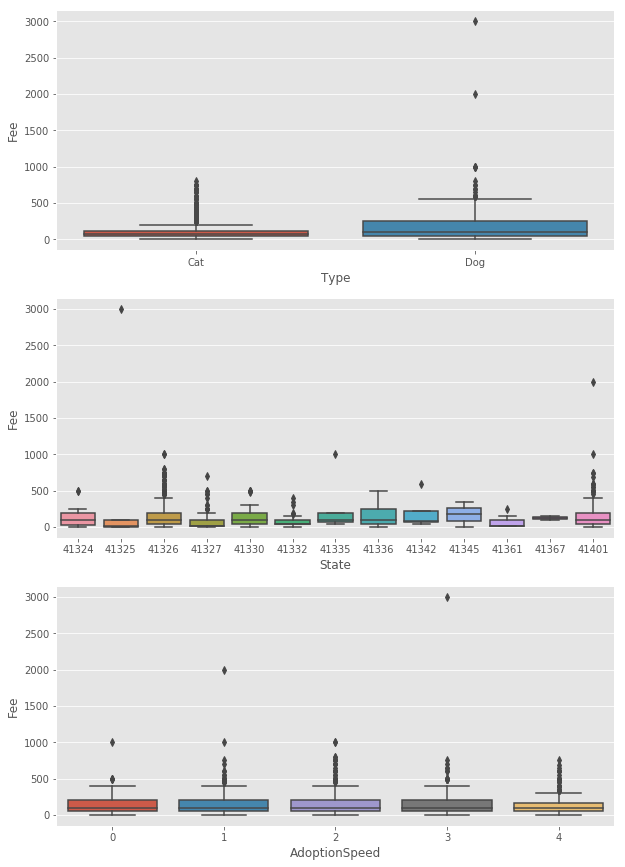

In [38]:
fig, ax = plt.subplots(3, 1, figsize = (10, 15))
sns.boxplot(un_free_adoption["Type"], un_free_adoption["Fee"], ax = ax[0])
sns.boxplot(un_free_adoption["State"], un_free_adoption["Fee"], ax = ax[1])
sns.boxplot(un_free_adoption["AdoptionSpeed"], un_free_adoption["Fee"], ax = ax[2])
plt.show()

## Breed

In [39]:
breeds = pd.read_csv("../input/breed_labels.csv")
breeds_dict = {k:v for k, v in zip(breeds["BreedID"], breeds["BreedName"])}
train["Breed1Name"] = train["Breed1"].apply(lambda x: breeds_dict[x] if x in breeds_dict else "Unknown")

In [40]:
train[train["Breed1Name"] == "Unknown"]

,Type,Name,Age,Breed1,Breed2,Gender,Color1,Color2,Color3,MaturitySize,FurLength,Vaccinated,Dewormed,Sterilized,Health,Quantity,Fee,State,RescuerID,VideoAmt,Description,PetID,PhotoAmt,AdoptionSpeed,Breed1Name
391,Dog,Lil Milo,2,0,26,2,2,0,0,2,1,1,1,2,1,1,0,41326,1a2113010d6048d5410b265347b35c91,0,"Milo went missing after a week with her new adoptive family. Only 3 months old, light brown coat. Missing from Jalan Kiara, Bandar Botanic, Klang. Please call Su at if you've seen her.",375905770,3.0,3,Unknown
1045,Dog,Bella 4 Months Puppy!,4,0,307,2,2,3,0,2,1,1,1,2,1,1,100,41326,3673e167fc9932b13149bed1f2a0180a,0,"She's only 4 months old, very friendly and loving. Loves attention. A little naughty sometimes. But she's adorable. I adopted her from MDDB, but recently I have just moved to a condo. Im finding a perfect and loving home for her.",da8d4a273,5.0,4,Unknown
3219,Cat,,3,0,266,3,1,4,7,1,1,2,1,2,1,3,0,41401,f7cff59d10c867bdee12c3f35f34d086,0,"Mama cat came to house and gave birth to these 03 lovely kittens, please adopt them and give them a home sweet home.",27e74e45c,11.0,2,Unknown
7285,Dog,"""Boy Boy""",72,0,307,1,1,2,0,2,2,2,2,2,1,1,0,41326,94b991f8dc1e0bb903ca8d4d492c8d43,0,"He is a stray dog found wandering around University Putra Malaysia (UPM), Serdang main campus. I have been told that a security guard saw a group of Malay boys used a stick to hit him and shoo him away. He does not show any physical injuries but have weak hind legs only. I hope a family can adopt him and give him a forever loving home which he deserves. Otherwise, I do not know what will happen to him due to UPM's no dog policy.",7b5bee232,5.0,4,Unknown
7706,Dog,Looking Newborn Puppy For Adoption,2,0,205,2,2,5,7,1,1,2,2,2,1,1,1,41336,5232bdd1444960a257ccec9a41404320,0,"I want to adopt a newborn puppy Prefer small breed,mix breed Mongreal also can Prefere female puppy If u dun have time to takecare them,can give me Im a dog lover Can sms/ call me Jb area.. Jb area",0327b8e94,0.0,3,Unknown


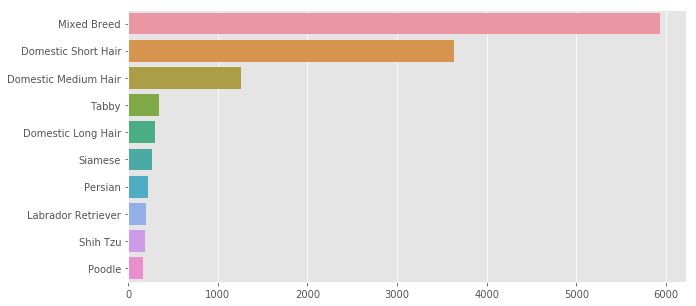

In [41]:
breeds_count = train["Breed1Name"].value_counts()[:10]
plt.figure(figsize = (10, 5))
sns.barplot(breeds_count.values, breeds_count.index)
plt.show()

## Images

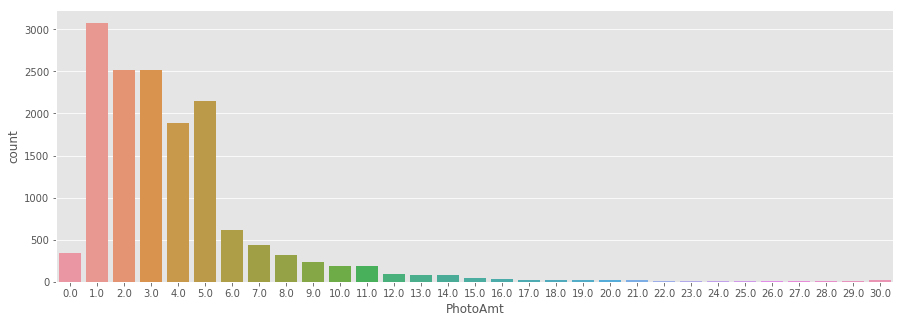

In [42]:
plt.figure(figsize = (15, 5))
sns.countplot(train["PhotoAmt"])
plt.show()

Most common Breeds of Small Cats


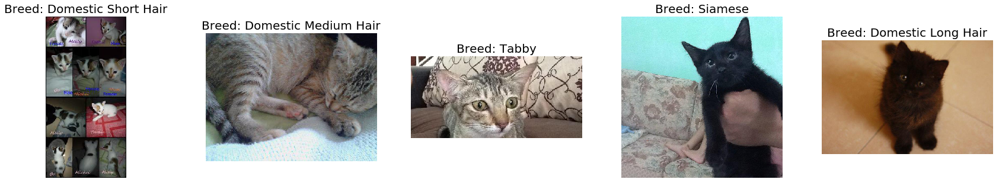

Most common Breeds of Medium Cats


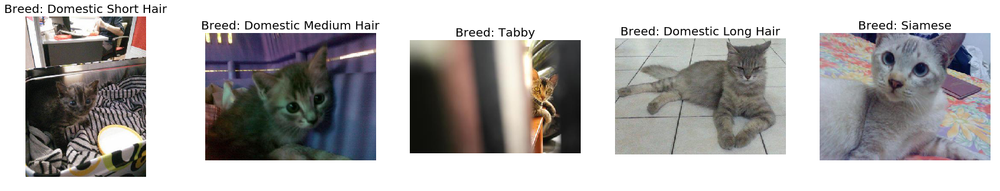

Most common Breeds of Large Cats


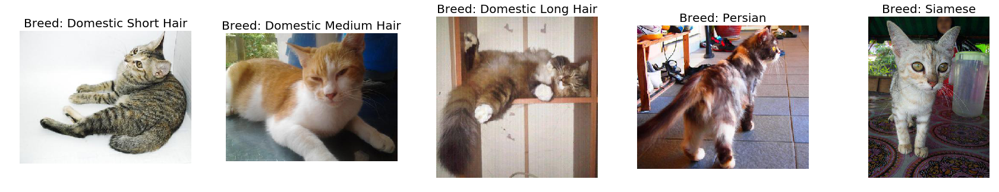

Most common Breeds of Extra Large Cats


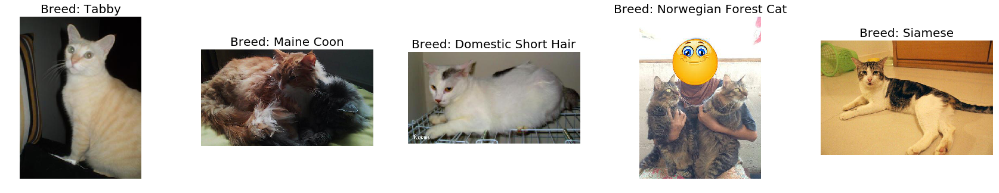

Most common Breeds of Small Dogs


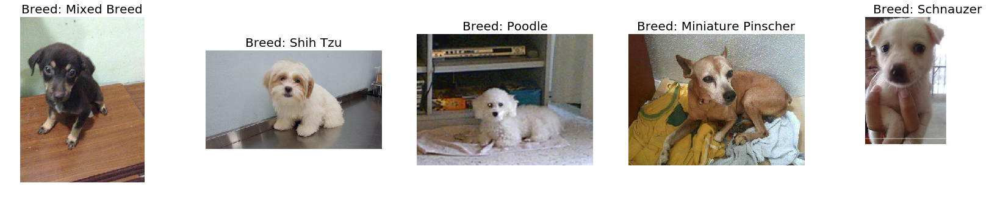

Most common Breeds of Medium Dogs


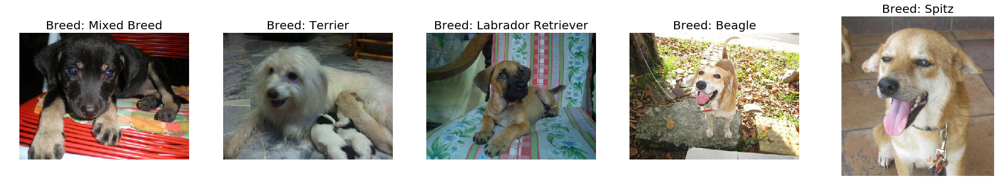

Most common Breeds of Large Dogs


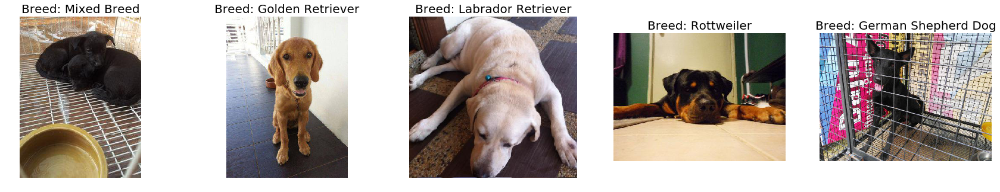

Most common Breeds of Extra Large Dogs


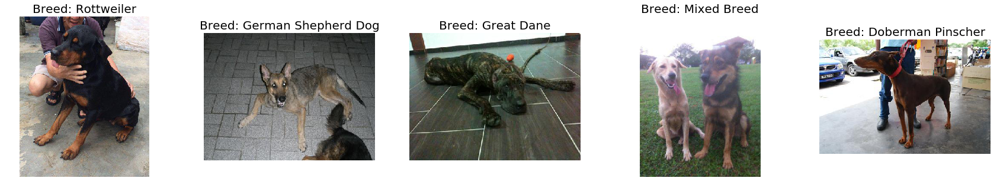

In [43]:
import os
from PIL import Image

images = [i.split("-")[0] for i in os.listdir("../input/train_images/")]
size_dict = {1: "Small", 2: "Medium", 3: "Large", 4: "Extra Large"}

for t in train["Type"].unique():
    for m in train["MaturitySize"].unique():
        data_frame = train.loc[(train["Type"] == t) & (train["MaturitySize"] == m)]
        top_breeds = list(data_frame["Breed1Name"].value_counts().index)[:5]
        s = size_dict[m]
        print("Most common Breeds of {} {}s".format(s, t))
        
        fig, ax = plt.subplots(1, 5, figsize = (30, 5))
        for i, breed in enumerate(top_breeds):
            p_data_frame = data_frame.loc[(data_frame["Breed1Name"] == breed) & 
                                          (data_frame["PetID"].isin(images)), "PetID"]
            if len(p_data_frame) > 1:
                pet_id = p_data_frame.values[1]
            else:
                pet_id = p_data_frame.values[0]
            im = Image.open("../input/train_images/" + pet_id + "-1.jpg")
            ax[i].imshow(im)
            ax[i].set_title("Breed: {}".format(breed), fontsize = 20)
            ax[i].axis("off")
        plt.show()

## Rescuer ID

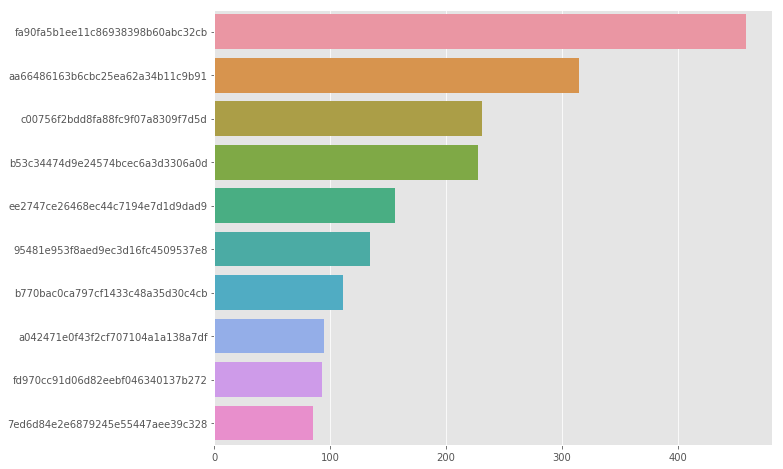

In [44]:
rescuerID_count = train["RescuerID"].value_counts()[:10]
plt.figure(figsize = (10, 8))
sns.barplot(rescuerID_count.values, rescuerID_count.index)
plt.show()

In [45]:
first_rescuer = train[train["RescuerID"] == rescuerID_count.index[0]]
first_rescuer.head()

,Type,Name,Age,Breed1,Breed2,Gender,Color1,Color2,Color3,MaturitySize,FurLength,Vaccinated,Dewormed,Sterilized,Health,Quantity,Fee,State,RescuerID,VideoAmt,Description,PetID,PhotoAmt,AdoptionSpeed,Breed1Name
2,Dog,Brisco,1,307,0,1,2,7,0,2,2,1,1,2,1,1,0,41326,fa90fa5b1ee11c86938398b60abc32cb,0,"Their pregnant mother was dumped by her irresponsible owner at the roadside near some shops in Subang Jaya. Gave birth to them at the roadside. They are all healthy and adorable puppies. Already dewormed, vaccinated and ready to go to a home. No tying or caging for long hours as guard dogs. However, it is acceptable to cage or tie for precautionary purposes. Interested to adopt pls call me.",3422e4906,7.0,3,Mixed Breed
48,Dog,Cute Puppies,1,307,0,3,1,2,0,2,1,3,3,2,1,9,0,41326,fa90fa5b1ee11c86938398b60abc32cb,0,We are cute and good girls and boys. We need a home sweet home. If u are interested to provide us a home. Pls contact,af1035c81,3.0,3,Mixed Breed
83,Dog,Cody,3,307,141,1,5,0,0,2,2,3,3,2,1,1,0,41326,fa90fa5b1ee11c86938398b60abc32cb,0,Lovely puppy with good nature looking for a home sweet home. Interested to adopt pls contact,815f4cc08,3.0,3,Mixed Breed
85,Dog,Mayo 2 Pups,1,307,0,2,1,2,0,2,2,2,2,2,1,2,0,41326,fa90fa5b1ee11c86938398b60abc32cb,0,Very adorable and cute puppies Commitment to spay them when reach 6 months old is compulsory Serious adopter pls call.,867308404,3.0,2,Mixed Breed
138,Dog,Polly,4,307,36,2,1,2,7,2,2,1,1,1,1,1,0,41326,fa90fa5b1ee11c86938398b60abc32cb,0,She was found wandering around a playground of a housing estate with a red collar. A group of boys was throwing stones at her. We strongly believe that she was owned by someone and is a lost dog based on her behaviour. If you are interested to adopt or if you are her owner pls call me.,6d9b202c9,10.0,3,Mixed Breed


In [46]:
first_rescuer["Breed1"].value_counts()

307    314
141    27 
78     15 
103    13 
239    12 
218    11 
26     10 
213    8  
31     6  
189    5  
20     3  
18     3  
283    3  
75     3  
76     2  
109    2  
185    2  
88     2  
200    2  
44     1  
85     1  
71     1  
119    1  
98     1  
105    1  
114    1  
128    1  
179    1  
190    1  
204    1  
205    1  
207    1  
227    1  
266    1  
17     1  
Name: Breed1, dtype: int64

In [47]:
state_rescuers_count = train[["State", "RescuerID"]].groupby(["State"])["RescuerID"].count()
state_rescuers_count

State
41324    137 
41325    110 
41326    8714
41327    843 
41330    420 
41332    253 
41335    85  
41336    507 
41342    13  
41345    22  
41361    26  
41367    15  
41401    3845
41415    3   
Name: RescuerID, dtype: int64